# Exploring SEGY data

### Using a cropped volume from a post-stack time-migrated survey from New Zealand called Kora3D. Kora3D is made public thanks to the New Zealand Petroleum and Minerals.
I try to avoid putting all of the seismic survey into RAM so I can extend these functions to larger surveys. This results in building inline, xline, and time slices from the segy file directly.

Notebook outline:  
1) View the 3200 byte EBCDIC header and defining trace headers  
2) Look at a few individual traces  
3) View survey geometry with some QC  
4) Visualize cross-sections and time slices

## View the 3200 byte EBCDIC header

In [1]:
import numpy as np
import struct
import matplotlib.pyplot as plt
import matplotlib.transforms as mtransforms

%matplotlib inline
#%load_ext autotime #magic for time stamps on each block


filename = 'Kora3D_Cropped.segy'

# open file and read first 3200 bytes
f = open(filename, 'rb')
ebcdic_bin = f.read(3200)
f.close()

# 40 lines with 80 bytes per line. 
ebcdic_list = ['']*40
for line, i in enumerate(range(0,3200,80)):
    ebcdic_list[line] = ebcdic_bin[i:i+80].decode('cp500')
    print(ebcdic_list[line])

C 1 SEGY OUTPUT FROM Petrel 2014.3 (64-bit) Tuesday, August 25 2015 10:37:39    
C 2 Name: Raw_Seismic ÝCrop¨ 1 Type: 3D seismic                                 
C 3                                                                             
C 4 First inline: 1050   Last inline: 1450                                      
C 5 First xline:  1400   Last xline:  2200                                      
C 6 CRS: PowerPlan:UTM8459S ("MENTOR:PowerPlan:UTM8459S:UTM Zone 59S - WGS84, Me
C 7 X min: 740760.11 max: 754377.73 delta: 13617.63                             
C 8 Y min: 5742476.48 max: 5756098.75 delta: 13622.27                           
C 9 Time min: -3054.00 max: 2.00 delta: 3056.00                                 
C10 Lat min: 38.26'0.7640"S max: 38.18'25.7811"S delta: 0.07'34.9829"           
C11 Long min: 173.45'13.1250"E max: 173.54'50.8712"E delta: 0.09'37.7462"       
C12 Trace min: -3052.00 max: 0.00 delta: 3052.00                                
C13 Seismic (template) min: 

### Get EBCDIC header parameters from first trace header

Manually input the byte locations from the EBCDIC header into the dictionary, 'EBCDIC_header_parameters'

In [2]:
# variables defining the 3D limit of survey from EBCDIC header
survey_limits = {
    'first_inline': 1050,
    'last_inline': 1450,
    'first_xline': 1400,
    'last_xline': 2200,
    'time_min': -2.00,
    'time_max': 3054.00,
    'X_min' : 740760.11,
    'X_max' : 754377.73,
    'Y_min' : 5742476.48,
    'Y_max' : 5756098.75
}
# location of variables within each individual trace header (locations provided from EBCDIC header)
EBCDIC_header_parameters = {
    'inline': [5, 8],
    'xline': [21,24],
    'coordinate_scale_factor': [71,72],
    'x_coordinate': [73,76],
    'y_coordinate': [77,80],
    'trace_start_time': [109,110],
    'num_samples_per_trace': [115,116],
    'sample_interval': [117,118]
}
num_samples_per_trace = int(3056 / 4) # total(delta) time divided by 4ms per sample
def get_trace_header(trace_index, num_samples_per_trace=num_samples_per_trace, EBCDIC_header_parameters=EBCDIC_header_parameters, 
                            filename=filename, verbose = False):
    # Summary: returns a dictionary of parameters from the trace header file using byte locations from EBCDIC header. 'trace_index'
    # 'trace_index' is the sequential location of the trace within the SEGY file
    # (ie trace_index=0 is the first trace in the SEGY file, trace_index=1 is the second, trace_index=2 is the third, etc...)
    trace_header_parameters = {
        'inline': None,
        'xline': None,
        'coordinate_scale_factor': None,
        'x_coordinate': None,
        'y_coordinate': None,
        'trace_start_time': None,
        'num_samples_per_trace': None,
        'sample_interval': None   
    }
    f = open(filename, 'rb')
    if verbose:
        template = '{:<29} {:<13}{:<15}{:}'
        print(template.format('\033[1m' + 'paramkey', 'EBCDIC','Bytes', 'Header Value'+'\033[0m' ))
    trace_byte_length = num_samples_per_trace * 4
    for param_key, param_val in EBCDIC_header_parameters.items():
        #3599 is length of EBCDIC header, 240 is length of trace header
        start_byte =int(3599 + (240+trace_byte_length)*(trace_index) + EBCDIC_header_parameters[param_key][0])
        end_byte   =int(3599 + (240+trace_byte_length)*(trace_index) + EBCDIC_header_parameters[param_key][1])
        f.seek(start_byte)
        if(end_byte - start_byte) == 3:
            # 4 bytes case
            trace_header_parameters[param_key], = struct.unpack('>i',f.read(4))
        elif(end_byte - start_byte) ==1:
            # 2 bytes case
            trace_header_parameters[param_key], = struct.unpack('>h',f.read(2))
        if verbose:
            template = '{:<25} {:<13}{:<15}{:}'
            print(template.format(param_key, str(param_val), str([start_byte, end_byte]),
                                  trace_header_parameters[param_key]))
    f.close()
    return trace_header_parameters

In [3]:
first_trace_header = get_trace_header(0, verbose = True)

paramkey                  EBCDIC       Bytes          Header Value
inline                    [5, 8]       [3604, 3607]   1050
xline                     [21, 24]     [3620, 3623]   1400
coordinate_scale_factor   [71, 72]     [3670, 3671]   -100
x_coordinate              [73, 76]     [3672, 3675]   74077163
y_coordinate              [77, 80]     [3676, 3679]   574733871
trace_start_time          [109, 110]   [3708, 3709]   0
num_samples_per_trace     [115, 116]   [3714, 3715]   764
sample_interval           [117, 118]   [3716, 3717]   4000


In [4]:
# header dump
template = '\033[1m{:<8}{:<9}{:<9}{:<15}{:}\033[0m'
print(template.format('index','inline', 'xline',  'x_coordinate*',   'y_coordinate*'))
for i in range(20):
    trace_header_params = get_trace_header(i)
    template = '{:<8}{:<9}{:<9}{:<15}{:}'
    print(template.format(i, trace_header_params['inline'],trace_header_params['xline'],
          trace_header_params['x_coordinate'],trace_header_params['y_coordinate']))
print('\033[1m*coordinates are not scaled\033[0m')

index   inline   xline    x_coordinate*  y_coordinate*
0       1050     1400     74077163       574733871
1       1050     1401     74078257       574733265
2       1050     1402     74079350       574732659
3       1050     1403     74080443       574732053
4       1050     1404     74081537       574731447
5       1050     1405     74082630       574730841
6       1050     1406     74083723       574730235
7       1050     1407     74084816       574729629
8       1050     1408     74085910       574729023
9       1050     1409     74087003       574728417
10      1050     1410     74088096       574727811
11      1050     1411     74089190       574727205
12      1050     1412     74090283       574726599
13      1050     1413     74091376       574725993
14      1050     1414     74092470       574725387
15      1050     1415     74093563       574724781
16      1050     1416     74094656       574724175
17      1050     1417     74095750       574723569
18      1050     1418     7

### Look at first few traces

In [5]:
def get_trace(trace_index,num_samples_per_trace=num_samples_per_trace, filename=filename, verbose = False):
    # Summary: returns an array containing the trace data specified by trace_index
    trace_byte_length = int(num_samples_per_trace*4)
    trace = np.zeros(int(num_samples_per_trace))
    start_byte =int(3600 + (240+trace_byte_length)*(trace_index) + 240)
    f = open(filename, 'rb')
    f.seek(start_byte)
    for i in range(num_samples_per_trace):
        trace[i], = struct.unpack('>f',f.read(4))
    f.close
    return trace

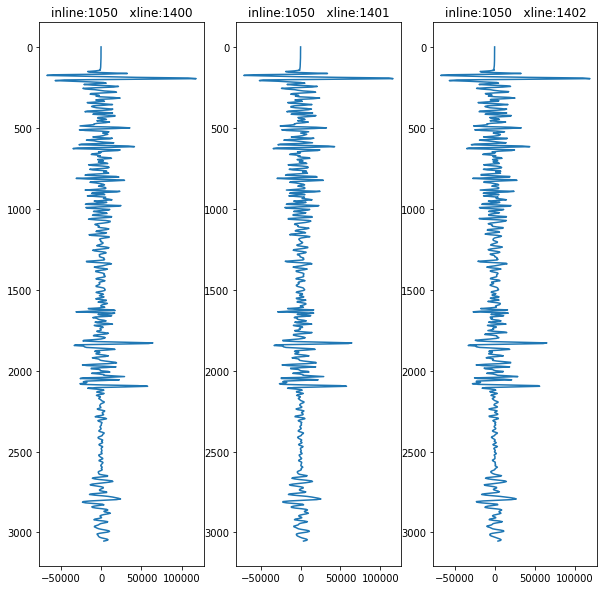

In [6]:
# visualizing traces
def show_single_trace(trace_index, survey_limits = survey_limits):
    # Summary: plots a single trace
    time_axis = np.linspace(survey_limits['time_min'],survey_limits['time_max'], num_samples_per_trace)
    plt.plot(get_trace(trace_index), time_axis)
    plt.title('inline:{0}   xline:{1}'.format(get_trace_header(trace_index)['inline'], 
                                              get_trace_header(trace_index)['xline']))
    plt.gca().invert_yaxis()
plt.figure(figsize = (10,10))
for i in range(3):
    plt.subplot(1, 3, i+1)
    show_single_trace(i)

### View Survey Geometry
To calculate the number of traces in the file:

1,058,682,096 file size(0.98GB) = 3600 byte EBCDIC_header + (240 byte trace_header + 764x4 byte trace_data) x number_of_traces

Also:

(1050-1450) inline x (2200-1400) xline --> 401 inlines x 801 xlines grid = 321201 traces

In [7]:
# indexing our segy file by making each trace index have a corresponding (inline, xline) pair.
# python's dictionary structure is convenient for this
number_of_traces = int((1058682096-3600)/(240 + 764*4))
print('number of traces: ', number_of_traces)

trace_id = {}
for i in range(number_of_traces):
    trace_header = get_trace_header(i)
    trace_id.update({
        (trace_header['inline'], trace_header['xline']): i
    })
print('trace_id format is trace_id[(inline_number, xline_number)]')

number of traces:  321201
trace_id format is trace_id[(inline_number, xline_number)]


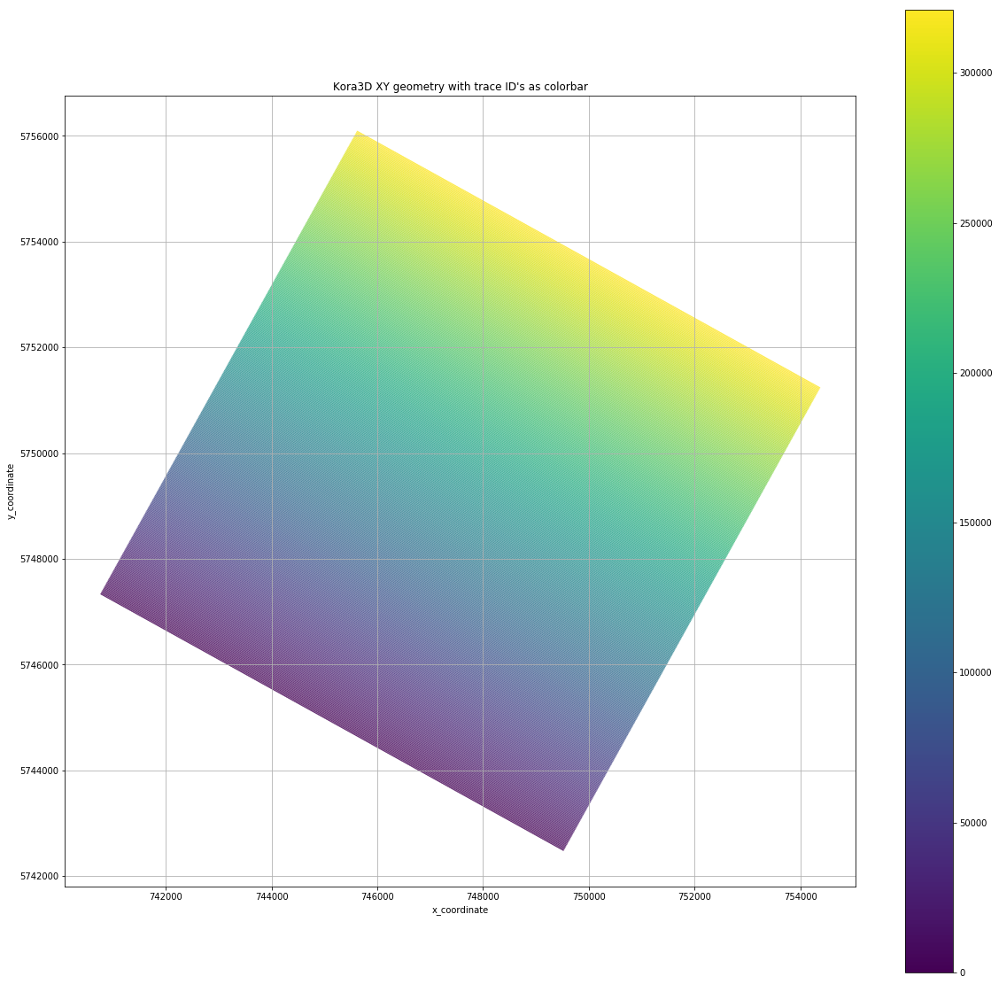

In [8]:
def get_coordinates(trace_index):
    # Summary: Read xy-coordinates from  trace header and apply coordinate scaling factor
    trace_header = get_trace_header(trace_index)
    x_coordinate = trace_header['x_coordinate']
    y_coordinate = trace_header['y_coordinate']
    scale_factor = trace_header['coordinate_scale_factor']
    
    if scale_factor < 0:
        x_coordinate = x_coordinate / abs(scale_factor)
        y_coordinate = y_coordinate / abs(scale_factor)
    elif scale_factor < 0:
        x_coordinate = x_coordinate * abs(scale_factor)
        y_coordinate = y_coordinate * abs(scale_factor)
    else:
        x_coordinate = x_coordinate
        y_coordinate = y_coordinate
        
    return x_coordinate, y_coordinate

def xy_survey_plot(trace_id = trace_id, figure_size = (20,20)):
    # Summary: plot the xy-coordinates for all traces
    number_of_trace = len(trace_id)
    x_coordinate = np.zeros(number_of_traces)
    y_coordinate = np.zeros(number_of_traces)
    id_num = np.zeros(number_of_traces)
    for id_value, index in enumerate(trace_id.values()):
        x_coordinate[index], y_coordinate[index] = get_coordinates(id_value)
        id_num[index] = id_value
    plt.figure(figsize = figure_size)
    plt.xlabel('x_coordinate')
    plt.ylabel('y_coordinate')
    plt.title('Kora3D XY geometry with trace ID\'s as colorbar')
    plt.scatter(x_coordinate,y_coordinate, s=0.1, c=id_num)
    plt.gca().set_aspect('equal')
    plt.colorbar()
    plt.grid()
xy_survey_plot()

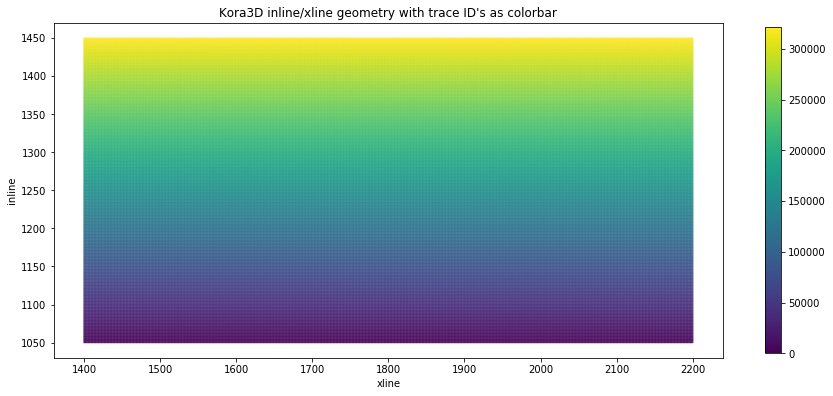

In [9]:
def inline_xline_plot(trace_id = trace_id):
    # Summary: convert the dictionary, trace_id, to a list. Plot colors against trace_id.values()
    number_of_traces = len(trace_id)
    inline_num = np.zeros(number_of_traces)
    xline_num = np.zeros(number_of_traces)
    id_num = np.zeros(number_of_traces)
    for index, (id_key, id_value) in enumerate(trace_id.items()):
        inline_num[index] = id_key[0]
        xline_num[index]  = id_key[1]
        id_num[index]     = id_value
    plt.figure(figsize = (15,15))
    plt.xlabel('xline')
    plt.ylabel('inline')
    plt.title('Kora3D inline/xline geometry with trace ID\'s as colorbar')
    plt.scatter(xline_num,inline_num, s=0.1, c=id_num)
    plt.gca().set_aspect('equal')
    plt.colorbar(shrink=0.4)
inline_xline_plot()

In [10]:
def get_inline(inline, trace_id=trace_id, survey_limits=survey_limits, filename=filename, verbose=False):
    # Summary: returns a 2-D array containing sorted list of all traces from inline with corresponding xline numbers.
    # check if inline is within survey limits
    if not (survey_limits['first_inline'] <= inline <= survey_limits['last_inline']):
        print('get_inline() error: inline exceeds boundaries')
        print('inline, first_inline, last_inline: {0}, {1}, {2}'.format(inline, survey_limits['first_inline'],
                                                                       survey_limits['last_inline']))
    # collect xlines that have the selected inline
    xlines = []
    for id_key, id_val in trace_id.items():
        if inline == id_key[0]:
            xlines.append(id_key[1])
    xlines = sorted(xlines)
    xlines = np.asarray(xlines)

    # extract trace values from segy file
    line_data = []
    for xl in xlines:
        single_id = trace_id[(inline, xl)]
        trace = get_trace(single_id)
        line_data.append(trace)
    line_data = np.asarray(line_data)
    
    return line_data, xlines
def get_xline(xline, trace_id=trace_id, survey_limits=survey_limits, filename=filename, verbose=False):
    # Summary: returns a 2-D array containing sorted list of all traces from xline with corresponding inline numbers.
    # check if xline is within survey limits
    if not (survey_limits['first_xline'] <= xline <= survey_limits['last_xline']):
        print('get_xline() error: xline exxceeds boundaries')
        print('xline, first_xline, last_xline: {0}, {1}, {2}'.format(xline, survey_limits['first_xline'],
                                                                      survey_limits['last_xline']))
    # collect xlines that have the selected inline
    inlines = []
    for id_key, id_val in trace_id.items():
        if xline == id_key[1]:
            inlines.append(id_key[0])
    inlines = sorted(inlines)
    inlines = np.asarray(inlines)
    
    # extract trace values from segy file    
    line_data = []
    for i in range(len(inlines)):
        single_id = trace_id[(inlines[i], xline)]
        trace = get_trace(single_id)
        line_data.append(trace)
    line_data = np.asarray(line_data)
        
    return line_data, inlines

## Visualize cross sections and time slices

Cross sections are taken along inlines or xlines. Moreover, the xy-coordinates can be used to give a better spatial understanding.

For cross sections, I would like to plot time vs line numbers and time vs xy-coordinates.

For time slices, I would like to plot line numbers vs line numbers and xy-coordinates vs xy-coordinates.


In [11]:
def show_inline(inline_number,aspect_ratio='equal', survey_limits=survey_limits):
    # Summary: 
    traces, xlines = get_inline(inline_number)
    traces = np.transpose(traces)
    plt.figure(figsize=(10,15))
    plt.imshow(traces,cmap=plt.cm.binary,aspect=aspect_ratio, extent=[survey_limits['first_xline'],
                                                                      survey_limits['last_xline'],
                                                                      survey_limits['time_max'],
                                                                      survey_limits['time_min']])
    plt.title('inline:{0}'.format(inline_number))
    plt.ylabel('time (ms)')
    plt.xlabel('xline')
    
def showxy_inline(inline_number,aspect_ratio='equal', trace_id=trace_id, survey_limits=survey_limits):
    # Summary:
    traces, xlines = get_inline(inline_number)
    traces = np.transpose(traces)
    
    # read x,y coordinates from each trace header along the inline
    x_coordinate = np.zeros(len(xlines))
    y_coordinate = np.zeros(len(xlines))
    for index, xln in enumerate(xlines):
        x_coordinate[index], y_coordinate[index] = get_coordinates(trace_id[inline_number, xln]) 

    # Calculate the xy extent of line.
    distance = np.zeros(len(xlines)-1)
    for index, xln in enumerate(range(len(xlines)-1)):
        distance[index] = ((x_coordinate[xln]-x_coordinate[xln+1])**2 + (y_coordinate[xln] - y_coordinate[xln+1])**2)**0.5
    xy_extent = np.sum(distance)

    # plotting the traces. stretch the traces to xy_extent
    plt.figure(figsize=(10,15))
    plt.imshow(traces,cmap=plt.cm.binary,aspect=aspect_ratio, extent=[0.0,
                                                                 xy_extent,
                                                                 survey_limits['time_max'],
                                                                 survey_limits['time_min']])
    plt.title('inline:{0}'.format(inline_number))
    plt.ylabel('time (ms)')
    plt.xlabel('distance')

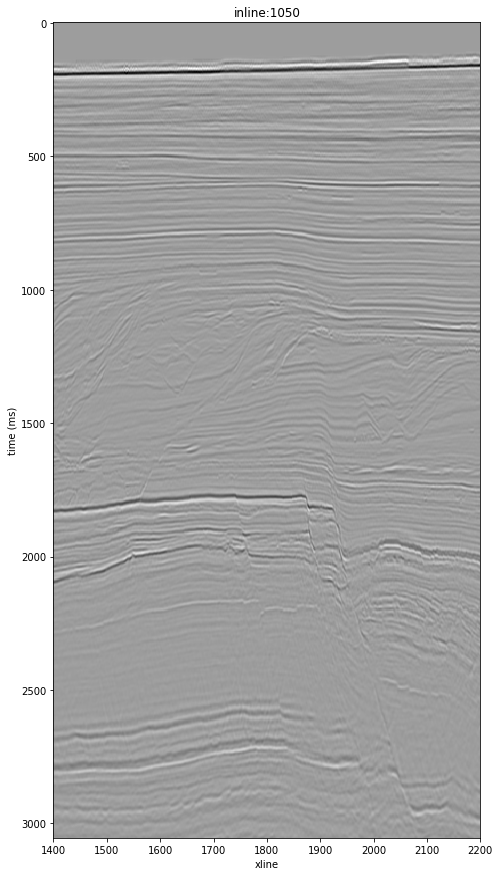

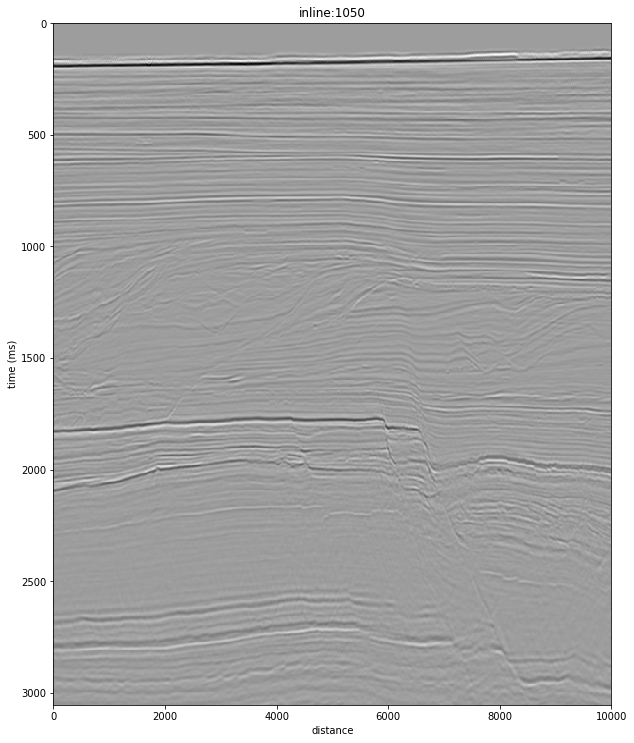

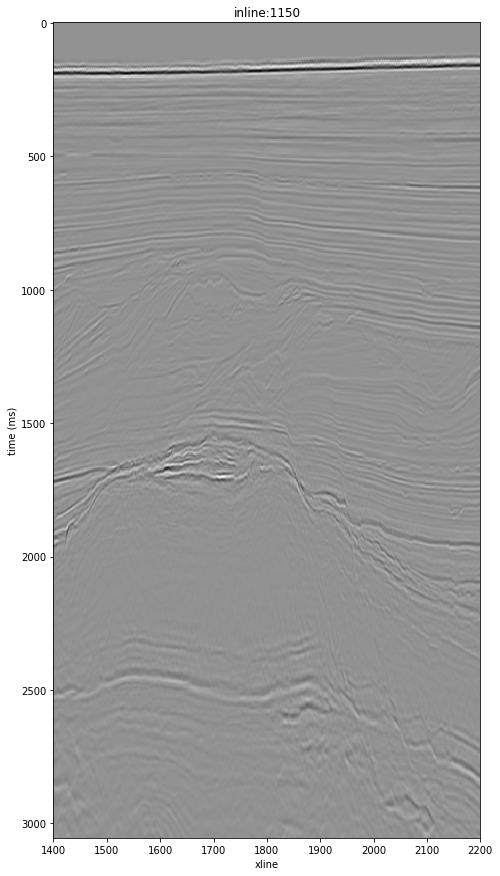

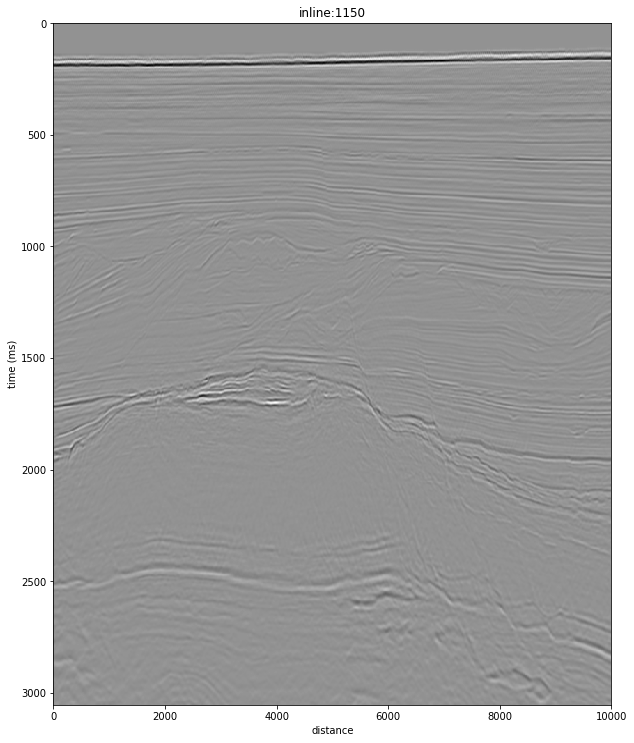

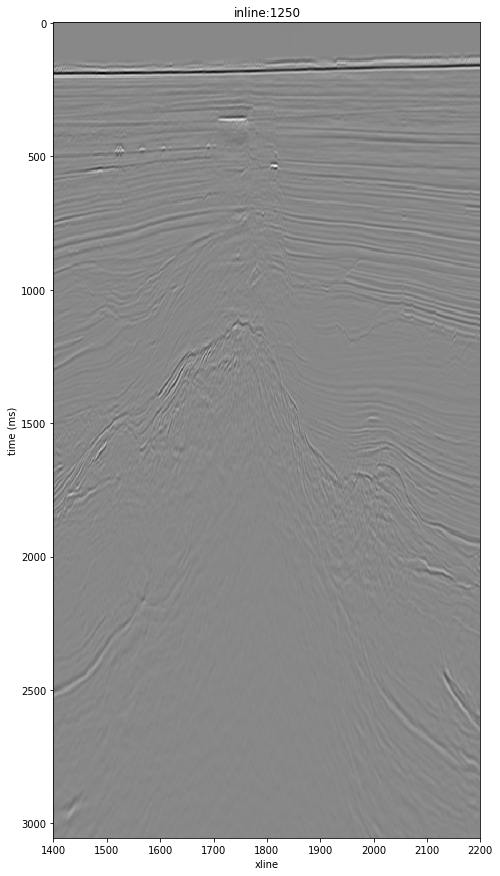

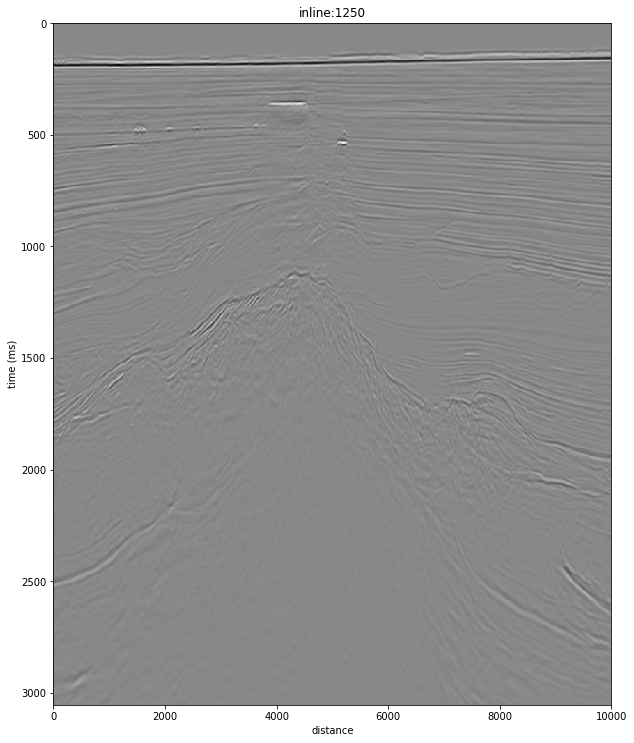

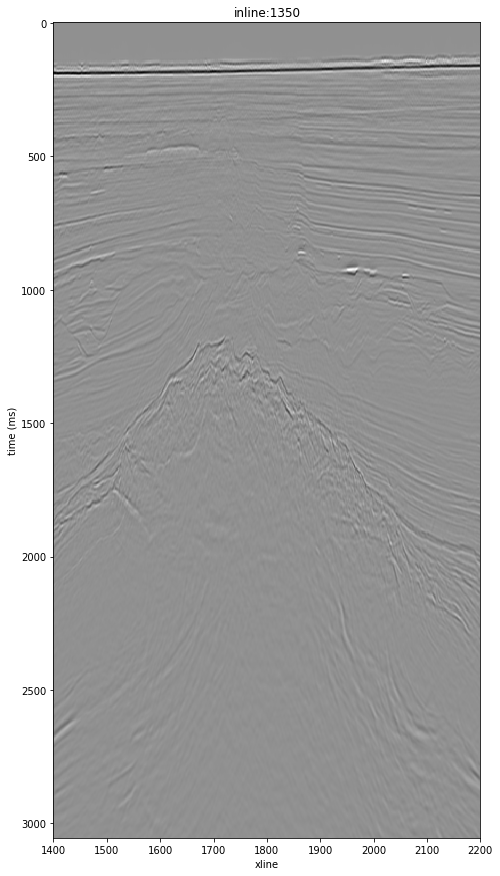

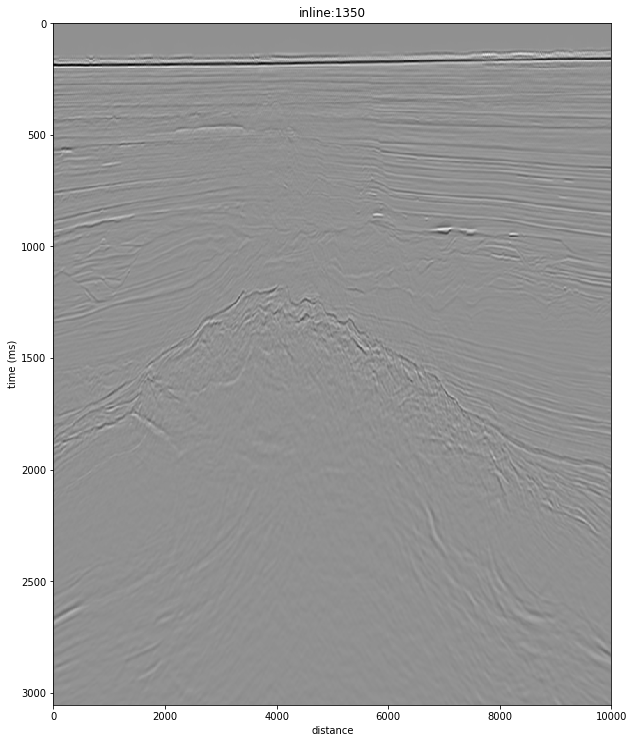

In [12]:
# inlines from 1050-1450 with intervals of 50
for i in range(survey_limits['first_inline'],survey_limits['last_inline'], 100):
    show_inline(i, aspect_ratio = 0.5)
    showxy_inline(i, aspect_ratio = 4)

In [13]:
def show_xline(xline_number,aspect_ratio='equal', survey_limits=survey_limits):
    traces, inlines = get_xline(xline_number)
    traces = np.transpose(traces)
    plt.figure(figsize=(10,15))
    plt.imshow(traces,cmap=plt.cm.binary,aspect=aspect_ratio, extent=[survey_limits['first_inline'],
                                                                      survey_limits['last_inline'],
                                                                      survey_limits['time_max'],
                                                                      survey_limits['time_min']])
    plt.title('xline:{0}'.format(xline_number))
    plt.ylabel('time (ms)')
    plt.xlabel('inline')

def showxy_xline(xline_number, aspect_ratio='equal',trace_id=trace_id, survey_limits=survey_limits):
    traces, inlines = get_xline(xline_number)
    traces = np.transpose(traces)
    
    # read x,y coordinates from each trace header along the inline
    number_of_traces = len(inlines)
    x_coordinate = np.zeros(number_of_traces)
    y_coordinate = np.zeros(number_of_traces)
    for index, inln in enumerate(inlines):
        x_coordinate[index], y_coordinate[index] = get_coordinates(trace_id[inln, xline_number]) 

    # Calculate the xy extent of line.
    distance = np.zeros(len(inlines)-1)
    for index, inln in enumerate(range(len(inlines)-1)):
        distance[index] = ((x_coordinate[inln]-x_coordinate[inln+1])**2 + (y_coordinate[inln] - y_coordinate[inln+1])**2)**0.5
    xy_extent = np.sum(distance)
        
    # plotting the traces. stretch the traces to xy_extent
    plt.figure(figsize=(10,15))
    plt.imshow(traces,cmap=plt.cm.binary,aspect=aspect_ratio, extent=[0.0,
                                                                 xy_extent,
                                                                 survey_limits['time_max'],
                                                                 survey_limits['time_min']])
    plt.title('xline:{0}'.format(xline_number))
    plt.ylabel('time (ms)')
    plt.xlabel('distance')

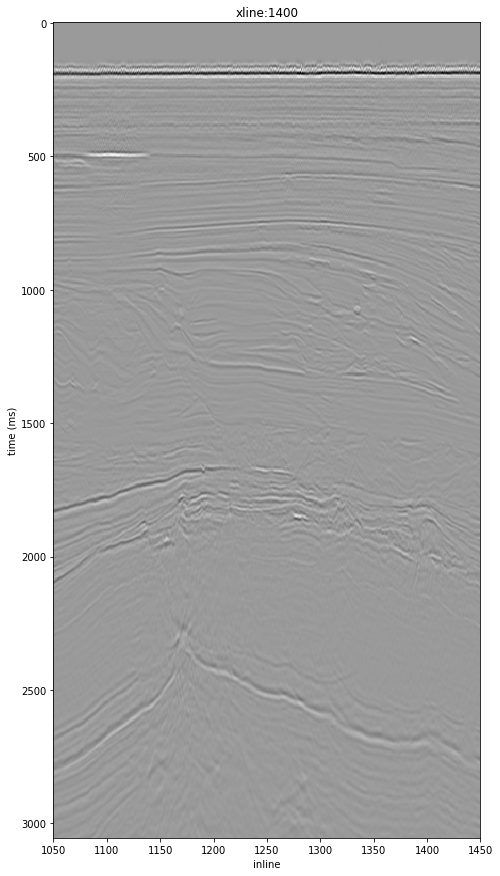

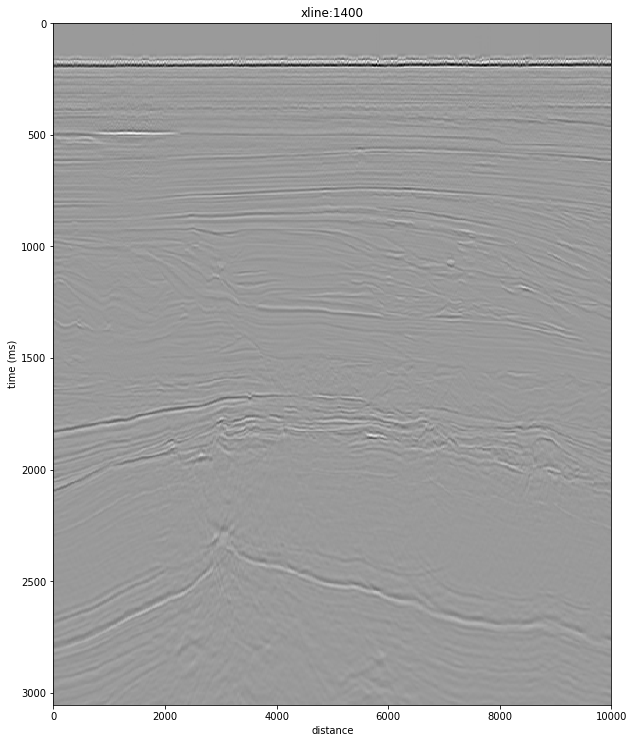

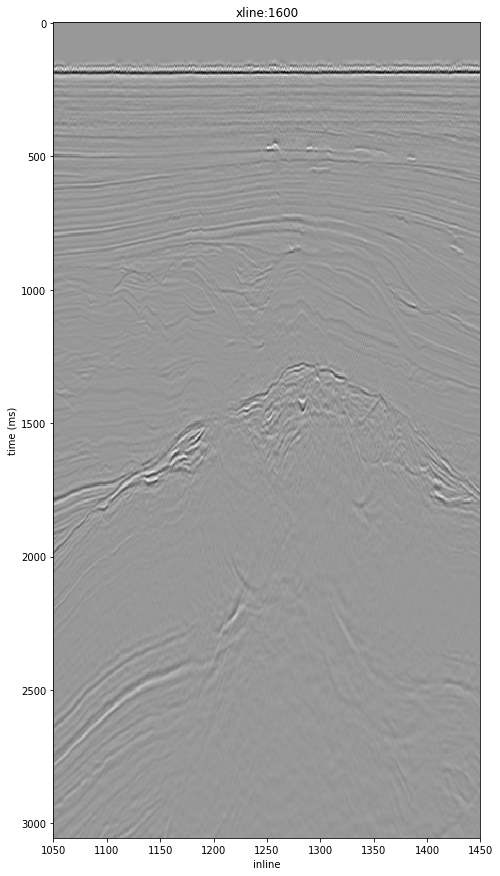

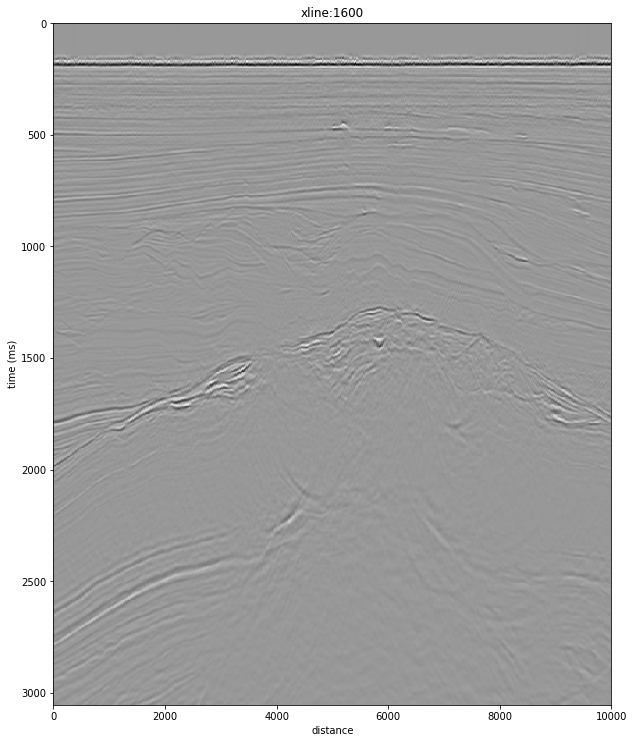

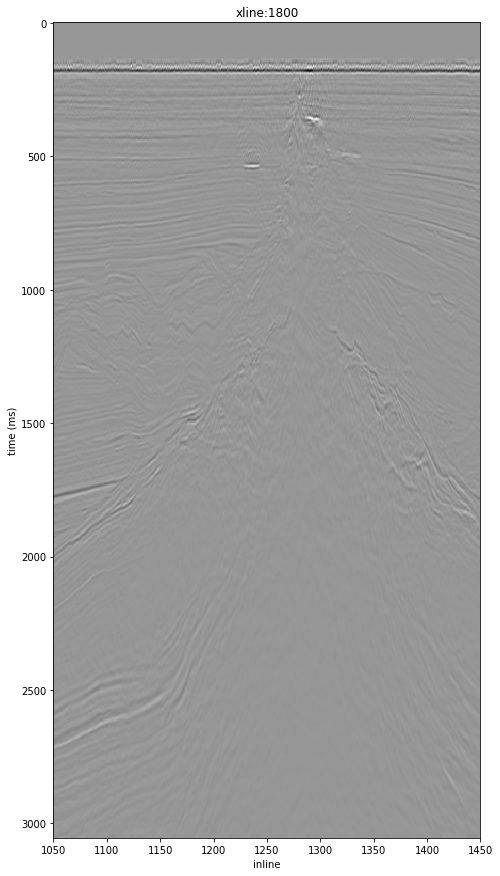

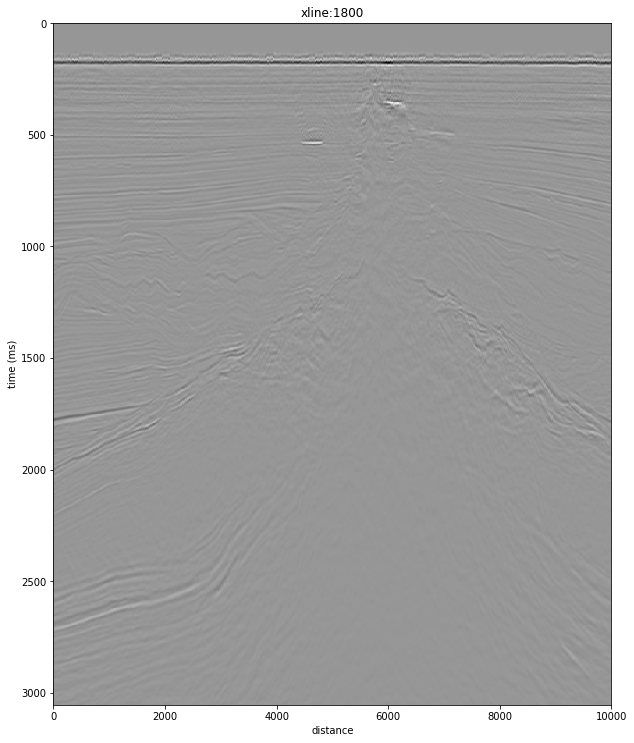

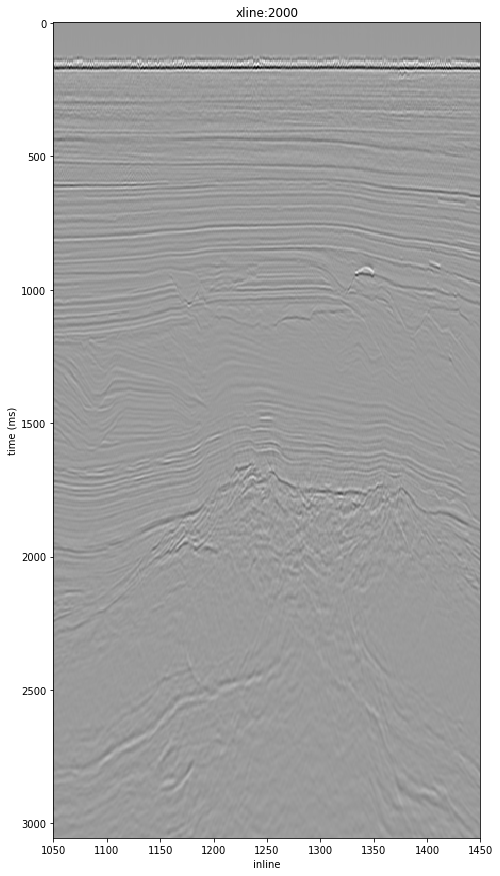

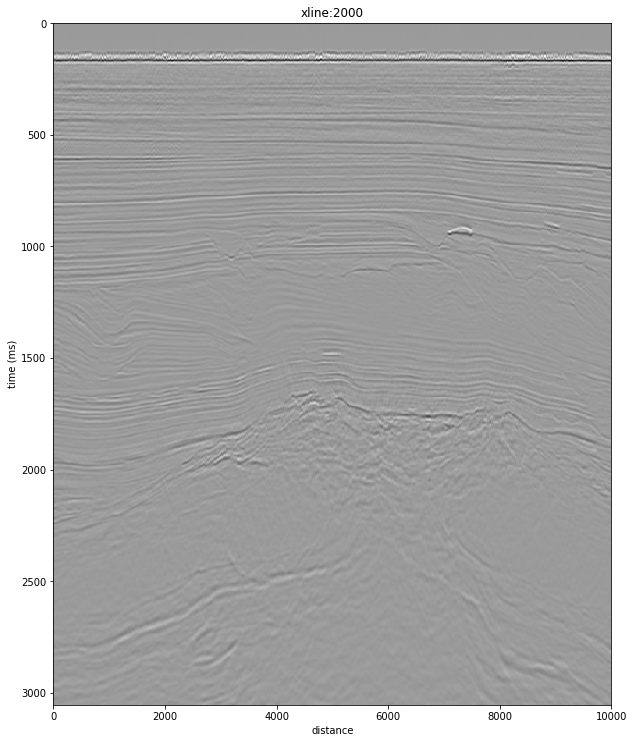

In [14]:
# xlines from 1400-2200 with intervals of 100
for i in range(survey_limits['first_xline'],survey_limits['last_xline'], 200):
    show_xline(i, aspect_ratio = 0.25)
    showxy_xline(i, aspect_ratio = 4)

In [15]:
def get_slice(mstime, trace_id=trace_id,survey_limits = survey_limits,num_samples_per_trace=num_samples_per_trace,
              filename=filename, verbose=False):
    # Summary: returns a 2-D array containing sorted list of all samples at mstime
    if not (survey_limits['time_min'] <= mstime <= survey_limits['time_max']):
        print('get_slice() error: mstime exceeds boundaries')
        print('mstime, time_min, time_max: {0}, {1}, {2}'.format(mstime, survey_limits['time_min'], 
                                                                 survey_limits['time_max']))
    # round to nearest sample
    nearest_sample = int(np.rint((mstime - survey_limits['time_min']) / 4) * 4 + survey_limits['time_min'])
    # define where to look for the byte indicated by mstime
    trace_byte_length = num_samples_per_trace*4
    trace_byte_location = int(nearest_sample - survey_limits['time_min'])
    number_of_traces = len(trace_id)
    horizontal_slice = np.zeros([number_of_traces,3])
    # go through all traces and select value from each trace  
    f = open(filename, 'rb')
    for index, (id_key, id_value) in enumerate(trace_id.items()):
        # starte byte = EBCDIC header + (trace+header)*num_of_traces + initial_trace_header + trace_byte_location
        start_byte =int(3600 + (240+trace_byte_length)*(id_value) + 240 + trace_byte_location)
        f.seek(start_byte)
        val = struct.unpack('>f',f.read(4)) # add [0]?
        #print([id_key[0], id_key[1], id_value])
        inln = id_key[0]
        xln = id_key[1]
        horizontal_slice[index] = [inln, xln, val[0]]
    f.close()
    
    # sort by inline first, and then by crossline (ie column 1, then column 2)
    horizontal_slice = horizontal_slice[np.lexsort(horizontal_slice.T[::-1])]
    
    # create arrays of inlines and crosslines from horizontal_slice for axes
    inlines = np.unique([trace[0] for trace in horizontal_slice])
    xlines  = np.unique([trace[1] for trace in horizontal_slice])
    values  = [trace[2] for trace in horizontal_slice]
    if verbose:
        print('slice array lengths: ', len(values), len(xlines), len(inlines))
        print('sample values: ',values[:10])
    horizontal_data = np.reshape(values, (len(inlines), len(xlines)))
    return horizontal_data, inlines, xlines

def show_slice(mstime, survey_limits=survey_limits):
    # Summary: show inline vs xline slice
    h_slice, inlines, xlines = get_slice(mstime)
    plt.figure(figsize=(10,40))
    plt.imshow(h_slice,cmap=plt.cm.binary,aspect ='equal',origin='lower', extent=[survey_limits['first_xline'],
                                                                                  survey_limits['last_xline'],
                                                                                  survey_limits['last_inline'],
                                                                                  survey_limits['first_inline']])
    nearest_sample = int(np.rint((mstime - survey_limits['time_min']) / 4) * 4 + survey_limits['time_min'])
    plt.title('time slice:{0}ms'.format(nearest_sample))
    plt.ylabel('xline')
    plt.xlabel('inline')
    plt.gca().invert_yaxis()
    
def get_survey_rotation(trace_id=trace_id, survey_limits=survey_limits):
    # Summary: get angle in degrees from the x-axis to first inline
    X1, Y1 = get_coordinates(trace_id[survey_limits['first_inline'], survey_limits['first_xline']]) 
    X2, Y2 = get_coordinates(trace_id[survey_limits['first_inline'], survey_limits['last_xline']]) 
    # trigonometry to find theta
    sine_arg = (Y2-Y1)/(((X2-X1)**2 + (Y2-Y1)**2)**0.5)
    theta = np.arcsin(sine_arg) * 180 / np.pi
    return theta

def rotate_survey(theta, x_coordinate, y_coordinate):
    # Summary: Rotation around a point: Remove center, perform rotation, add back center. 
    new_coordinate = np.asarray(list(zip(x_coordinate,y_coordinate)))
    
    # remove center
    x_center = np.mean(x_coordinate)
    y_center = np.mean(y_coordinate)
    new_coordinate[:,0] = new_coordinate[:,0] - x_center
    new_coordinate[:,1] = new_coordinate[:,1] - y_center

    # perform rotation. rotation_matrix = [cos -sin; sin cos]
    theta = theta * np.pi / 180 # convert to radians
    rotation_matrix = np.array([[np.cos(theta), -np.sin(theta)],[np.sin(theta), np.cos(theta)]])
    for i in range(len(x_coordinate)):
        new_coordinate[i,:] = np.matmul(rotation_matrix, new_coordinate[i,:])
        
    # add back center
    new_coordinate[:,0] = new_coordinate[:,0] + x_center
    new_coordinate[:,1] = new_coordinate[:,1] + y_center  
    
    return new_coordinate[:,0], new_coordinate[:,1] # return x_coordinate, y_coordinate

def showxy_slice(mstime, trace_id=trace_id, survey_limits = survey_limits):
    # Summary: show a horizontal slice in the xy-coordinate system
    h_slice, inlines, xlines = get_slice(mstime)
    x_coordinate = np.zeros(number_of_traces)
    y_coordinate = np.zeros(number_of_traces)
    # get x,y coordinates to match the ravel(h_slice)
    index = 0
    for inln in inlines:
        for xln in xlines:
            x_coordinate[index], y_coordinate[index] = get_coordinates(trace_id[inln,xln])
            index+=1
    # get center of the survey
    x_center = np.mean(x_coordinate)
    y_center = np.mean(y_coordinate)
    
    # get angle between x-axis and first inline
    theta = get_survey_rotation()
    
    # rotate survey so first inline is parallel to x-axis
    x_coordinate, y_coordinate = rotate_survey(-theta, x_coordinate, y_coordinate)
    
    # determine new survey extent in units of xy-coordinates
    extent = np.array([np.min(x_coordinate), np.max(x_coordinate), np.min(y_coordinate), np.max(y_coordinate)])
    
    # plot h_slice as a rectangle using extent  
    # https://matplotlib.org/gallery/images_contours_and_fields/affine_image.html
    fig, ax = plt.subplots(figsize = (10,10))
    im = ax.imshow(h_slice, origin='lower',cmap=plt.cm.binary,aspect='equal', extent=extent)
    
    # rotate the image theta degrees around center of image
    rotation = mtransforms.Affine2D().rotate_deg_around(x_center, y_center, theta)
    rot_h_slice = rotation + ax.transData
    im.set_transform(rot_h_slice)
    
    # set limit on axes using survey_limits
    ax.set_xlim([survey_limits['X_min'], survey_limits['X_max']])
    ax.set_ylim([survey_limits['Y_min'], survey_limits['Y_max']])
    
    # labels
    plt.xlabel('x_coordinate')
    plt.ylabel('y_coordinate')
    nearest_sample = int(np.rint((mstime - survey_limits['time_min']) / 4) * 4 + survey_limits['time_min'])
    plt.title('time slice:{0}ms'.format(nearest_sample))

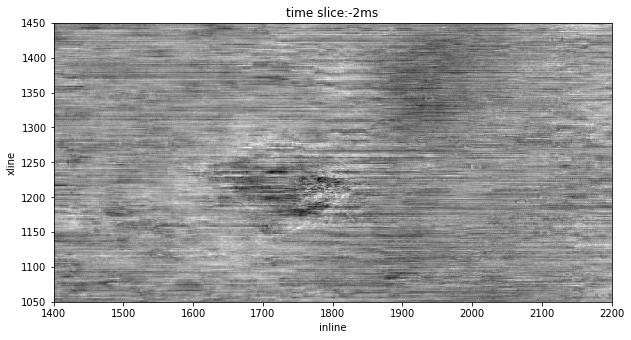

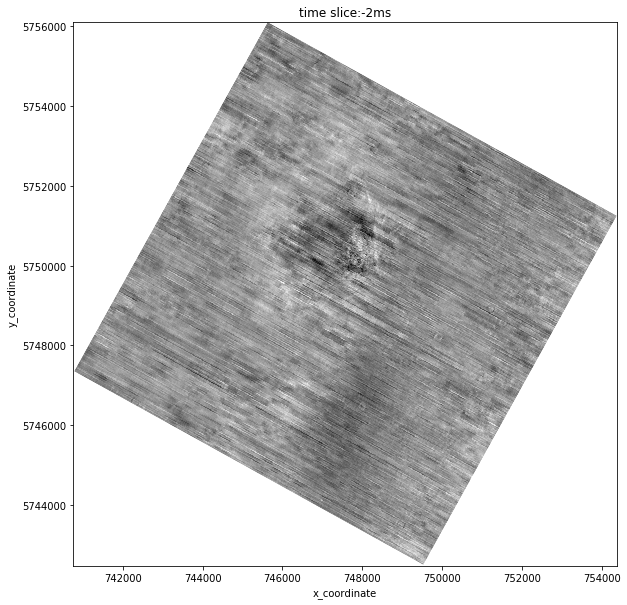

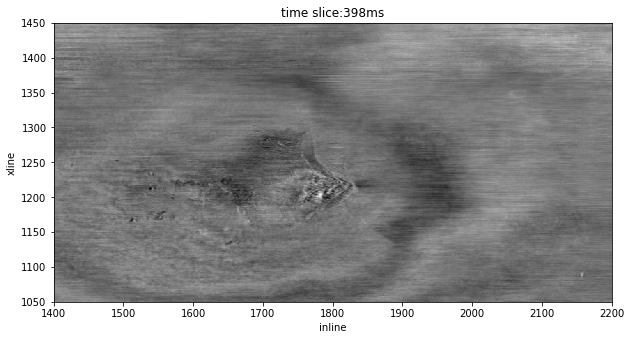

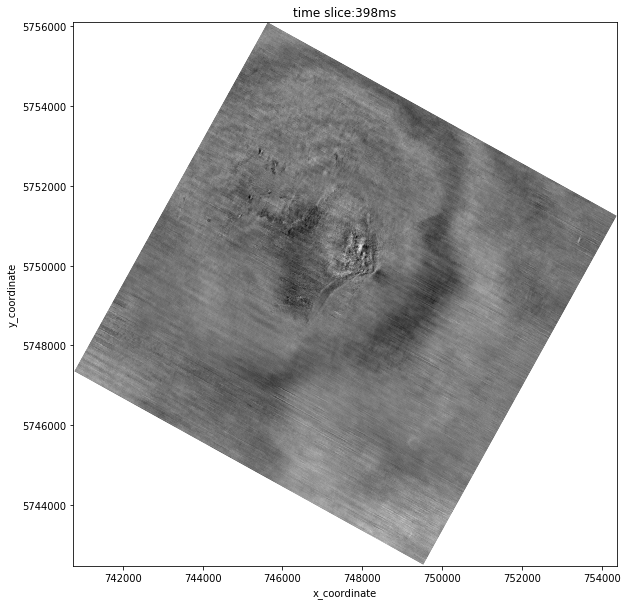

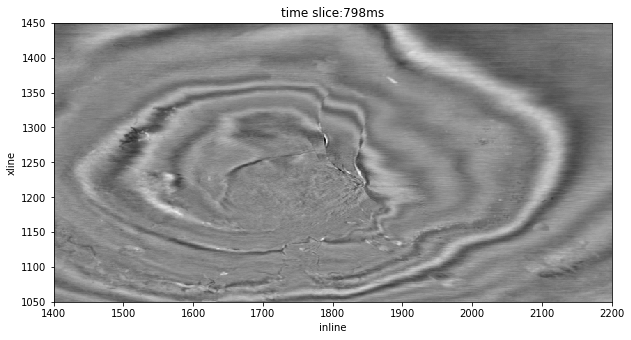

...

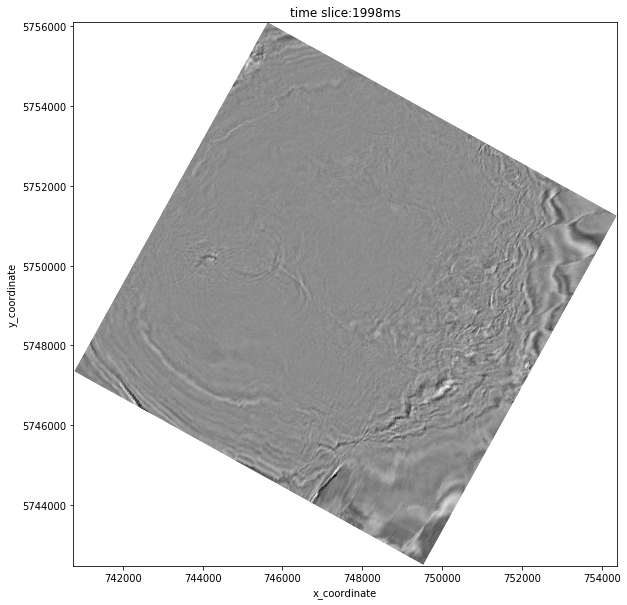

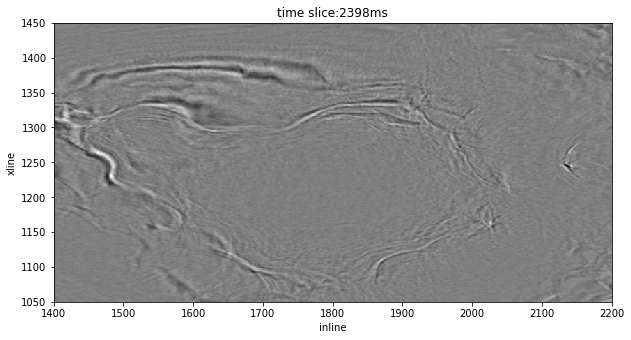

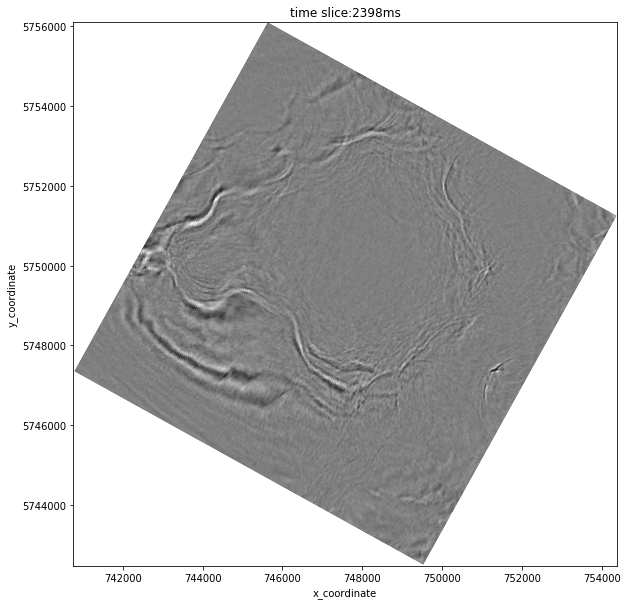

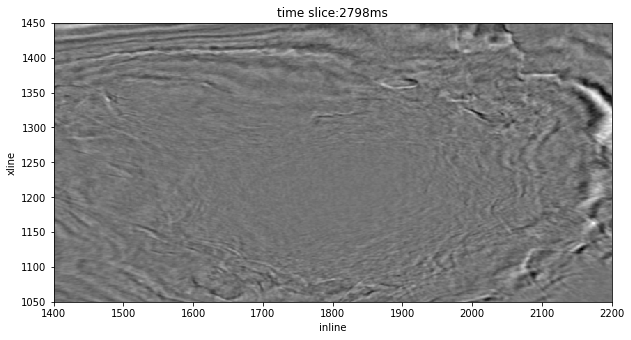

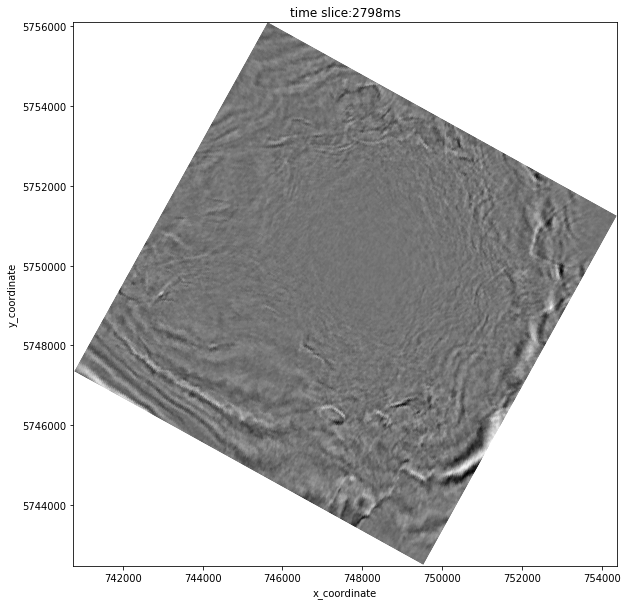

In [16]:
for i in range(int(survey_limits['time_min']), int(survey_limits['time_max']), 400):
    show_slice(i)
    showxy_slice(i)